In [2]:
#data manipulation and analysis
import pandas as pd #data manipulation (https://pandas.pydata.org/)
import numpy as np #data analysis - arrays, linear algebra, fourier transform, and matrices (https://numpy.org/)

#data visualization
import matplotlib.pyplot as plt #data visualization library (https://matplotlib.org/stable/plot_types/index)
import seaborn as sns #data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics (https://seaborn.pydata.org/)
import plotly.express as px #interactive data anlysis and visualization tools (https://plotly.com/python/plotly-express/)

/home/nikolaholodkov/.local/lib/python3.8/site-packages/pandas/compat/_optional.py:161: UserWarning: Pandas requires version '1.3.1' or newer of 'bottleneck' (version '1.2.1' currently installed).
  warnings.warn(msg, UserWarning)


In [4]:
#pandas
df = pd.DataFrame(pd.read_excel("Trieste_tas_rcp4.5.xlsx"))
df["Date"] = pd.to_datetime(df["Date"])
df

,Unnamed: 0,comune,Date,1,2,3,4,5
0,0,Trieste,1971-01-01,4.179656,0.591622,3.486482,2.974186,2.807987
1,1,Trieste,1971-01-02,5.780427,0.622637,5.640190,3.649876,3.923282
2,2,Trieste,1971-01-03,5.979268,-2.332241,5.012232,2.645080,2.826085
3,3,Trieste,1971-01-04,3.743411,-5.269343,4.959031,3.172264,1.651341
4,4,Trieste,1971-01-05,4.058999,-5.020667,5.319370,3.242048,1.899938
...,...,...,...,...,...,...,...,...
47477,47477,Trieste,2100-12-27,-8.420085,1.353886,-5.678798,8.558141,-1.046714
47478,47478,Trieste,2100-12-28,-6.978979,2.486582,-1.673203,6.593728,0.107032
47479,47479,Trieste,2100-12-29,-3.551324,3.757774,0.514494,8.690565,2.352877
47480,47480,Trieste,2100-12-30,-0.615761,5.505007,1.164422,6.750497,3.201041


In [5]:
#pandas dataframe
del df["Unnamed: 0"]
del df["comune"]
df2 = df.groupby(df['Date'].dt.year)['5'].agg(["mean"])
df2 = pd.DataFrame(df2).reset_index()
df2

,Date,mean
0,1971,11.037451
1,1972,10.727106
2,1973,11.049316
3,1974,10.978603
4,1975,10.581081
...,...,...
125,2096,12.228316
126,2097,13.143211
127,2098,12.342880
128,2099,13.150057


/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py:1402: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

/usr/lib/python3/dist-packages/matplotlib/axes/_base.py:276: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.

/usr/lib/python3/dist-packages/matplotlib/axes/_base.py:278: FutureWarning:

Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.



Text(0.5, 1.0, 'Temp media a Trieste - RCP4.5')

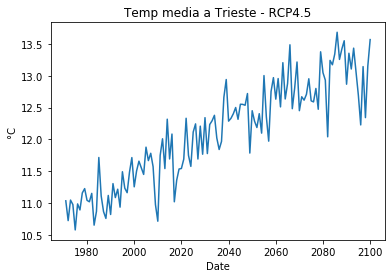

In [4]:
#pandas & matplotlib (https://matplotlib.org/stable/plot_types/index)
x = df2["Date"]
y = df2["mean"]
plt.plot(x, y)
plt.xlabel("Date")
plt.ylabel("°C")
plt.title("Temp media a Trieste - RCP4.5")

Text(0.5, 1.0, 'Temp media a Trieste - RCP4.5')

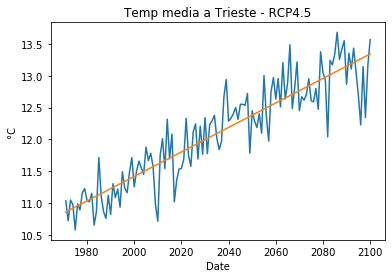

In [5]:
#numpy & matplotlib
x = np.array(df2["Date"])
y = np.array(df2["mean"])

#create scatterplot
plt.plot(x, y)

#calculate equation for trendline
z = np.polyfit(x, y, 1)
p = np.poly1d(z)

#add trendline to plot
plt.plot(x, p(x))
plt.xlabel("Date")
plt.ylabel("°C")
plt.title("Temp media a Trieste - RCP4.5")


In [3]:
df3 = pd.DataFrame(pd.read_excel("Trieste_tas_rcp4.5.xlsx"))
df3["Date"] = pd.to_datetime(df3["Date"])
df3['year'] = pd.DatetimeIndex(df3['Date']).year
df3['month'] = pd.DatetimeIndex(df3['Date']).month
del df3["comune"]
del df3["Unnamed: 0"]

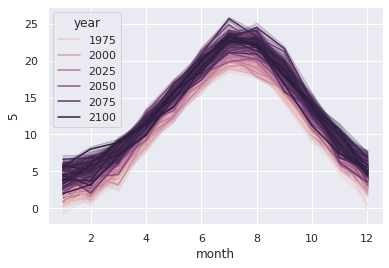

In [7]:
#data visualization with seaborn (https://seaborn.pydata.org/)
sns.set_theme(style="darkgrid")
sns.lineplot(x="month", y="5", data=df3, hue="year")

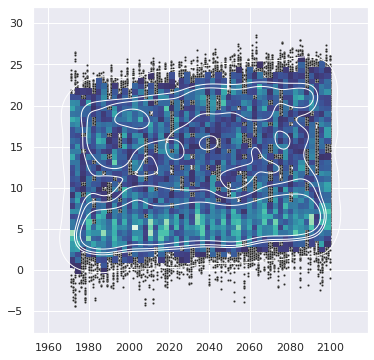

In [8]:
f, ax = plt.subplots(figsize=(6, 6))
sns.scatterplot(x=x, y=y, s=5, color=".15")
sns.histplot(x=x, y=y, bins=50, pthresh=.1, cmap="mako")
sns.kdeplot(x=x, y=y, levels=5, color="w", linewidths=1)

In [9]:
#data visualization with plotly (https://plotly.com/python/)
fig = px.line(df2, x="Date", y="mean")
fig.show()

In [10]:
fig = px.scatter(df2, x="Date", y="mean", trendline="ols")
fig.show()

In [13]:
lista = 0
lista_comuni = ['Aiello del Friuli', 'Amaro', 'Ampezzo', 'Andreis', 'Aquileia', 'Arba', 'Arta Terme', 'Artegna', 'Attimis', 'Aviano', 'Azzano Decimo', 'Bagnaria Arsa', 'Barcis', 'Basiliano', 'Bertiolo', 'Bicinicco', 'Bordano', 'Brugnera', 'Budoia', 'Buja', 'Buttrio', 'Camino al Tagliamento', 'Campoformido', 'Campolongo Tapogliano', 'Caneva', 'Capriva del Friuli', 'Carlino', 'Casarsa della Delizia', 'Cassacco', 'Castelnovo del Friuli', 'Castions di Strada', 'Cavasso Nuovo', 'Cavazzo Carnico', 'Cercivento', 'Cervignano del Friuli', 'Chions', 'Chiopris-Viscone', 'Chiusaforte', 'Cimolais', 'Cividale del Friuli', 'Claut', 'Clauzetto', 'Codroipo', 'Colloredo di Monte Albano', 'Comeglians', 'Cordenons', 'Cordovado', 'Cormons', 'Corno di Rosazzo', 'Coseano', 'Dignano', 'Doberdo del Lago', 'Dogna', 'Dolegna del Collio', 'Drenchia', 'Duino Aurisina', 'Enemonzo', 'Erto e Casso', 'Faedis', 'Fagagna', 'Fanna', "Farra d'Isonzo", 'Fiume Veneto', 'Fiumicello Villa Vicentina', 'Flaibano', 'Fogliano Redipuglia', 'Fontanafredda', 'Forgaria nel Friuli', 'Forni Avoltri', 'Forni di Sopra', 'Forni di Sotto', 'Frisanco', 'Gemona del Friuli', 'Gonars', 'Gorizia', "Gradisca d'Isonzo", 'Grado', 'Grimacco', 'Latisana', 'Lauco', 'Lestizza', 'Lignano Sabbiadoro', 'Lusevera', 'Magnano in Riviera', 'Majano', 'Malborghetto Valbruna', 'Maniago', 'Manzano', 'Marano Lagunare', 'Mariano del Friuli', 'Martignacco', 'Medea', 'Meduno', 'Mereto di Tomba', 'Moggio Udinese', 'Moimacco', 'Monfalcone', 'Monrupino', 'Montenars', 'Montereale Valcellina', 'Moraro', 'Morsano al Tagliamento', 'Mortegliano', 'Moruzzo', 'Mossa', 'Muggia', 'Muzzana del Turgnano', 'Nimis', 'Osoppo', 'Ovaro', 'Pagnacco', 'Palazzolo dello Stella', 'Palmanova', 'Paluzza', 'Pasian di Prato', 'Pasiano di Pordenone', 'Paularo', 'Pavia di Udine', 'Pinzano al Tagliamento', 'Pocenia', 'Polcenigo', 'Pontebba', 'Porcia', 'Pordenone', 'Porpetto', 'Povoletto', 'Pozzuolo del Friuli', 'Pradamano', 'Prata di Pordenone', 'Prato Carnico', 'Pravisdomini', 'Precenicco', 'Premariacco', 'Preone', 'Prepotto', 'Pulfero', 'Ragogna', 'Ravascletto', 'Raveo', 'Reana del Rojale', 'Remanzacco', 'Resia', 'Resiutta', 'Rigolato', "Rive d'Arcano", 'Rivignano Teor', "Romans d'Isonzo", 'Ronchi dei Legionari', 'Ronchis', 'Roveredo in Piano', 'Ruda', 'Sacile', 'Sagrado', "San Canzian d'Isonzo", 'San Daniele del Friuli', 'San Dorligo della Valle', 'San Floriano del Collio', 'San Giorgio della Richinvelda', 'San Giorgio di Nogaro', 'San Giovanni al Natisone', 'San Leonardo', 'San Lorenzo Isontino', 'San Martino al Tagliamento', "San Pier d'Isonzo", 'San Pietro al Natisone', 'San Quirino', 'San Vito al Tagliamento', 'San Vito al Torre', 'San Vito di Fagagna', 'Santa Maria la Longa', 'Sappada', 'Sauris', 'Savogna', "Savogna d'Isonzo", 'Sedegliano', 'Sequals', 'Sesto al Reghena', 'Sgonico', 'Socchieve', 'Spilimbergo', 'Staranzano', 'Stregna', 'Sutrio', 'Taipana', 'Talmassons', 'Tarcento', 'Tarvisio', 'Tavagnacco', "Terzo d'Aquileia", 'Tolmezzo', 'Torreano', 'Torviscosa', 'Tramonti di Sopra', 'Tramonti di Sotto', 'Trasaghis', 'Travesio', 'Treppo Grande', 'Treppo Ligosullo', 'Tricesimo', 'Trieste', 'Trivignano Udinese', 'Turriaco', 'Udine', 'Vajont', 'Valvasone Arzene', 'Varmo', 'Venzone', 'Verzegnis', 'Villa Santina', 'Villesse', 'Visco', "Vito d'Asio", 'Vivaro', 'Zoppola', 'Zuglio']

df5 = pd.DataFrame({
    "Date": df["Date"]
})

for i in range(215):
    comune = pd.read_excel(f"../FVG/variabili/tas/per_comune/{lista_comuni[lista]}_tas_rcp4.5.xlsx")
    df5[lista_comuni[lista]] = comune["5"]
    lista += 1
print(df5)

/tmp/ipykernel_315/2071117318.py:10: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_315/2071117318.py:10: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_315/2071117318.py:10: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_315/2071117318.py:10: PerformanceWarn

            Date  Aiello del Friuli     Amaro   Ampezzo   Andreis  Aquileia  \
0     1971-01-01           2.959979 -4.680152 -6.236118 -5.682847  3.901085   
1     1971-01-02           3.726989 -2.950266 -6.065992 -4.134322  4.492129   
2     1971-01-03           3.361577 -3.339057 -5.628231 -3.746892  4.007122   
3     1971-01-04           2.434982 -5.460178 -7.016722 -5.711660  2.823695   
4     1971-01-05           1.885791 -5.001209 -8.571645 -7.308341  2.766794   
...          ...                ...       ...       ...       ...       ...   
47477 2100-12-27           1.152734 -4.444739 -7.057632 -4.201293  1.842728   
47478 2100-12-28           1.125879 -4.009516 -5.819523 -3.573697  2.211472   
47479 2100-12-29           2.998229 -1.883078 -3.806283 -1.561698  4.032578   
47480 2100-12-30           3.471784 -0.999239 -3.069461 -0.961182  4.697521   
47481 2100-12-31           3.414717 -0.353432 -2.279289 -0.499202  4.908573   

           Arba  Arta Terme   Artegna   Attimis  ..

/tmp/ipykernel_315/2071117318.py:10: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [10]:
df5 = pd.read_excel("df5.xlsx")



In [32]:
df5 = pd.DataFrame(df5)
#df5['year'] = pd.DatetimeIndex(df5['Date']).year
df5 = df5.groupby("year").mean()
df5 = pd.DataFrame(df5).reset_index()


In [29]:
df5

,year,index,Aiello del Friuli,Amaro,Ampezzo,Andreis,Aquileia,Arba,Arta Terme,Artegna,...,Varmo,Venzone,Verzegnis,Villa Santina,Villesse,Visco,Vito d'Asio,Vivaro,Zoppola,Zuglio
0,1971,182.0,11.793147,6.323059,3.701856,5.765538,12.118034,9.633141,4.818902,8.837824,...,11.487267,6.679024,6.661288,4.955007,11.844291,11.727326,7.960124,10.744510,11.548972,5.030066
1,1972,547.5,11.563714,6.304987,3.613804,5.771148,11.898892,9.562133,4.796864,8.776103,...,11.326425,6.676624,6.641677,4.937176,11.609551,11.500458,7.899490,10.611537,11.336234,5.028178
2,1973,913.0,11.787923,6.361631,3.808889,5.808471,12.137930,9.509135,4.905955,8.796384,...,11.455760,6.729328,6.664425,5.036323,11.841432,11.717952,7.930083,10.704550,11.538959,5.112378
3,1974,1278.0,11.667228,6.182853,3.445860,5.441013,12.019094,9.429877,4.629661,8.714245,...,11.369818,6.559526,6.468310,4.729418,11.732402,11.592087,7.778320,10.559283,11.362386,4.822925
4,1975,1643.0,11.318873,5.903582,3.392572,5.381085,11.693923,9.242404,4.407883,8.430349,...,11.066670,6.281371,6.233075,4.581560,11.367491,11.252850,7.545167,10.321615,11.099457,4.625763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,2096,45838.5,13.095494,7.621685,5.075398,7.030372,13.411248,10.903465,6.171238,10.090090,...,12.807122,7.966715,7.973054,6.321381,13.137289,13.028745,9.257333,12.038338,12.853830,6.398881
126,2097,46204.0,13.970479,8.871705,6.364046,8.232256,14.224843,11.935165,7.479402,11.200800,...,13.664969,9.204260,9.174593,7.604315,14.022339,13.902458,10.380293,12.971903,13.692122,7.702569
127,2098,46569.0,13.159429,7.775709,5.027014,7.129741,13.517833,11.031136,6.281279,10.232290,...,12.858424,8.132504,8.058208,6.364595,13.202719,13.093913,9.321654,12.101361,12.875792,6.495296
128,2099,46934.0,13.855566,8.743622,6.255747,8.182913,14.222299,11.821171,7.326534,11.106244,...,13.555301,9.073642,9.065777,7.451281,13.921017,13.784261,10.268711,12.846191,13.575504,7.532275


In [44]:
fig = px.line(df5, x="year", y=df5.columns)
fig.show()

/home/nikolaholodkov/.local/lib/python3.8/site-packages/plotly/express/_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/home/nikolaholodkov/.local/lib/python3.8/site-packages/plotly/express/_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/home/nikolaholodkov/.local/lib/python3.8/site-packages/plotly/express/_core.py:1222: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once

In [46]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/fips-unemp-16.csv",
                   dtype={"fips": str})

import plotly.graph_objects as go

fig = go.Figure(go.Choroplethmapbox(geojson=counties, locations=df.fips, z=df.unemp,
                                    colorscale="Viridis", zmin=0, zmax=12,
                                    marker_opacity=0.5, marker_line_width=0))
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_zoom=3, mapbox_center = {"lat": 37.0902, "lon": -95.7129})
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [47]:
import plotly.graph_objects as go

import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')
df.head()

df['text'] = df['name'] + '<br>Population ' + (df['pop']/1e6).astype(str)+' million'
limits = [(0,2),(3,10),(11,20),(21,50),(50,3000)]
colors = ["royalblue","crimson","lightseagreen","orange","lightgrey"]
cities = []
scale = 5000

fig = go.Figure()

for i in range(len(limits)):
    lim = limits[i]
    df_sub = df[lim[0]:lim[1]]
    fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = df_sub['lon'],
        lat = df_sub['lat'],
        text = df_sub['text'],
        marker = dict(
            size = df_sub['pop']/scale,
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])))

fig.update_layout(
        title_text = '2014 US city populations<br>(Click legend to toggle traces)',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )
    )

fig.show()